>### Assignment - 4
>
> ----
>#### Name: Balkrishna Sehra
>#### Roll no: 24210022
>
> ___

In [82]:
### Imports
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
import torch
from torchvision import transforms
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter

In [ ]:
## Data Preparation

return # Comment this when need to run
# Directories where your images are stored
source_dirs = ['./duckduckgo_images/Bobcat', './duckduckgo_images/Jackal']
base_output_dir = Path('dataset')

# Train-test split ratio
train_ratio = 0.8  # 80% training, 20% testing

def split_data(source_dir, output_dir, train_ratio):
    # Create train and test directories if not present
    train_dir = output_dir / 'train' / source_dir.split('/')[-1]
    test_dir = output_dir / 'test' / source_dir.split('/')[-1]

    train_dir.mkdir(parents=True, exist_ok=True)
    test_dir.mkdir(parents=True, exist_ok=True)

    # List all image files in the source directory
    image_files = list(Path(source_dir).glob('*.jpg')) + list(Path(source_dir).glob('*.jpeg')) + list(Path(source_dir).glob('*.png'))
    
    # Split data into train and test sets
    train_files, test_files = train_test_split(image_files, train_size=train_ratio, random_state=42)

    # Move images to train directory
    for file_path in train_files:
        shutil.copy2(file_path, train_dir / file_path.name)
    
    # Move images to test directory
    for file_path in test_files:
        shutil.copy2(file_path, test_dir / file_path.name)
    
    print(f"Moved {len(train_files)} images to {train_dir}")
    print(f"Moved {len(test_files)} images to {test_dir}")

def main():
    if not base_output_dir.exists():
        base_output_dir.mkdir(parents=True)
    
    for source_dir in source_dirs:
        split_data(source_dir, base_output_dir, train_ratio)

if __name__ == "__main__":
    main()


SyntaxError: 'return' outside function (3434550180.py, line 3)

#### Preprocessing 

In [ ]:

return # Comment this when need to run
# Define the preprocessing transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize to ImageNet standards
])

# Function to preprocess images in a directory
def preprocess_images(input_dir, output_dir):
    input_path = Path(input_dir)
    output_path = Path(output_dir)

    # Create the output directory if it doesn't exist
    output_path.mkdir(parents=True, exist_ok=True)

    # Process each image in the directory
    for image_file in input_path.glob('*.*'):  # Matches all image file types
        try:
            img = Image.open(image_file).convert('RGB')  # Open and ensure 3 channels (RGB)
            img_transformed = transform(img)
            # Save the preprocessed tensor to a file if needed or continue training with it
            torch.save(img_transformed, output_path / f"{image_file.stem}.pt")  # Save as .pt file
        except Exception as e:
            print(f"Error processing {image_file}: {e}")

# Preprocess training and testing images
preprocess_images('./dataset/train/bobcat', 'preprocessed/train/bobcat')
preprocess_images('./dataset/train/jackal', 'preprocessed/train/jackal')
preprocess_images('./dataset/test/bobcat', 'preprocessed/test/bobcat')
preprocess_images('./dataset/test/jackal', 'preprocessed/test/jackal')


SyntaxError: 'return' outside function (2653338673.py, line 1)

/var/folders/4k/xxxy9tg127s6hyrvg1srwct00000gn/T/ipykernel_22514/3422852374.py:43: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  selected_tensors = [torch.load(file_paths[i]

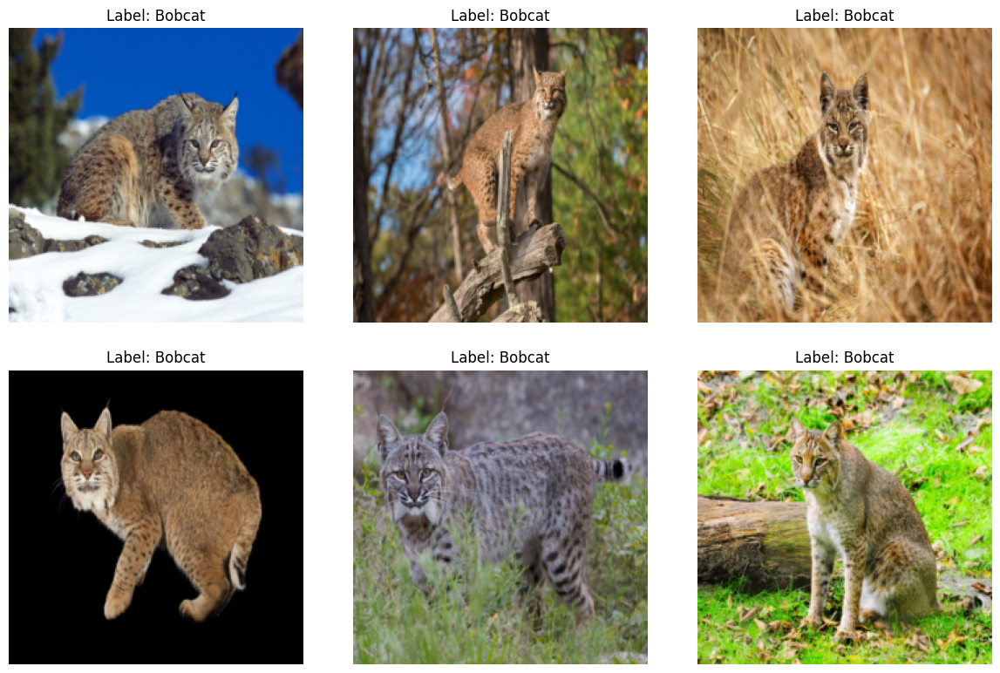

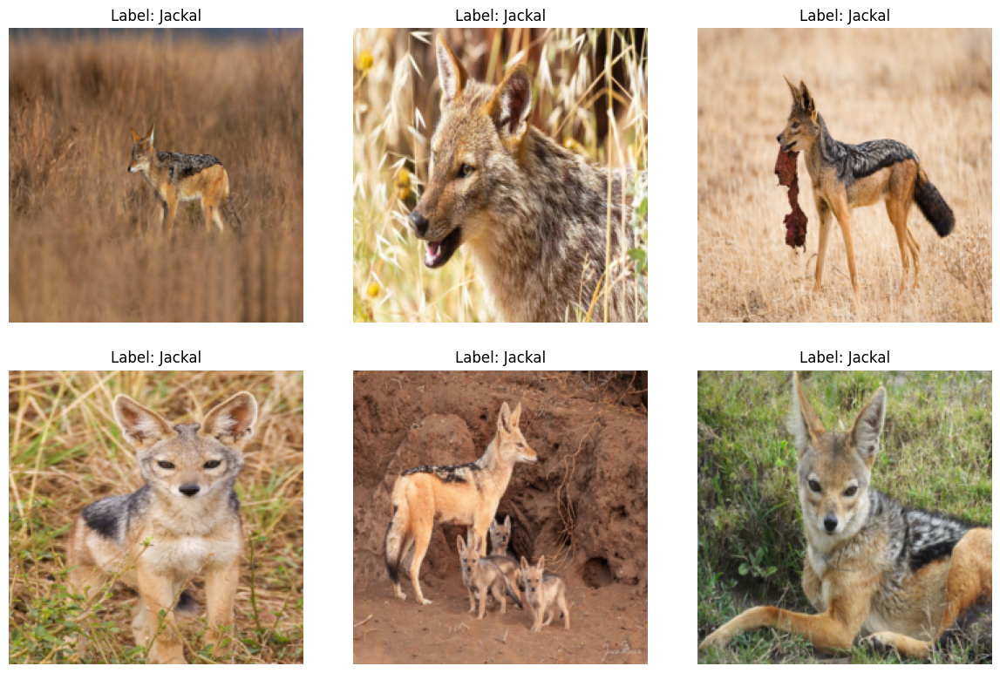

In [61]:
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import random

random.seed(40)

# Function to display images in a grid
def show_images_grid(tensors, labels, rows=2, cols=3):
    fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
    fig.tight_layout()
    
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    for i, (tensor, label) in enumerate(zip(tensors, labels)):
        if i >= rows * cols:
            break
        
        image = tensor * std[:, None, None] + mean[:, None, None]  # Denormalize
        image = image.permute(1, 2, 0)  # Change dimensions to H x W x C
        
        ax = axes[i // cols, i % cols]
        ax.imshow(image.numpy())
        ax.set_title(f'Label: {"Bobcat" if label == 0 else "Jackal"}')
        ax.axis('off')
    
    plt.show()

# Load images and visualize in a grid with random selection
def visualize_dataset_in_grid(data_dir, num_images=6, rows=2, cols=3):
    # Set the random seed for consistency
    
    file_paths = list(Path(data_dir).glob('*.pt'))
    labels = [0 if 'bobcat' in str(path).lower() else 1 for path in file_paths]

    # Shuffle the file paths and labels together
    combined = list(zip(file_paths, labels))
    random.shuffle(combined)
    file_paths, labels = zip(*combined)

    # Select random images based on the shuffled paths
    selected_tensors = [torch.load(file_paths[i]) for i in range(num_images)]
    selected_labels = labels[:num_images]
    
    show_images_grid(selected_tensors, selected_labels, rows=rows, cols=cols)

# Visualize training images for Bobcat and Jackal with random selection
visualize_dataset_in_grid('preprocessed/train/bobcat', num_images=6)
visualize_dataset_in_grid('preprocessed/train/jackal', num_images=6)


#### Creating DataLoader

In [62]:
import torch
from torch.utils.data import DataLoader, Dataset
import os
from pathlib import Path

class PreProcessedDataset(Dataset):
    def __init__(self, data_dir):
        self.data_dir = Path(data_dir)
        self.file_paths = list(self.data_dir.glob('**/*.pt'))
        self.labels = [0 if 'bobcat' in str(path).lower() else 1 for path in self.file_paths]

        # Debug: Print number of files found
        print(f"Found {len(self.file_paths)} .pt files in {data_dir}")

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        file_path = self.file_paths[idx]
        image_tensor = torch.load(file_path, weights_only=True)  # Load the .pt file
        label = self.labels[idx]
        return image_tensor, label

def get_data_loader(data_dir, batch_size = 32):
    dataset = PreProcessedDataset(data_dir)
    data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return data_loader


#### Creating Models

In [63]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm

class VGGCustom(nn.Module):
    def __init__(self, num_blocks=1, num_classes=2):
        super().__init__()
        self.features = self._add_layers(num_blocks)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * (224 // (2 ** num_blocks)) * (224 // (2 ** num_blocks)), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, num_classes)
        )
    
    def _add_layers(self, num_blocks):
        layers = []
        in_channels = 3
        for _ in range(num_blocks):
            layers.append(nn.Conv2d(in_channels, 64, kernel_size=3, padding=1))
            layers.append(nn.ReLU(inplace=True))
            layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
            in_channels = 64
        return nn.Sequential(*layers)
    
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

def create_vgg_model(num_blocks=1, num_classes=2):
    model = VGGCustom(num_blocks=num_blocks, num_classes=num_classes)
    return model

def train_model(model, train_loader, criterion, optimizer, device, num_epochs=10):
    model.to(device)
    for epoch in tqdm(range(num_epochs)):
        model.train()
        running_loss = 0.0
        training_loss = []
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
        
        avg_loss = running_loss / len(train_loader)
        training_loss.append(avg_loss)
        # print(f"Epoch {epoch + 1}/num_epochs, Loss: {avg_loss:0.6f}")
    print(f"Final loss on train set: {training_loss[-1]:.6f}")
    print("Training Complete")
    return model, training_loss

# Main function to set-up and train
def train_VGG1B():
    device = torch.device('mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu')
    model = create_vgg_model(1, 2).to(device)

    train_loader = get_data_loader('preprocessed/train')

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr = 0.01)
    return train_model(model, train_loader, criterion, optimizer, device, 100)


In [64]:
vgg1b, train_loss_vgg1b = train_VGG1B()

Found 239 .pt files in preprocessed/train


100%|██████████| 100/100 [03:05<00:00,  1.86s/it]

Final loss on train set: 0.125611
Training Complete


In [65]:
def train_VGG3B():
    device = torch.device('mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu')
    model = create_vgg_model(num_blocks=3).to(device)

    train_loader = get_data_loader('preprocessed/train')

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr = 0.01)
    return train_model(model, train_loader, criterion, optimizer, device, 100)

vgg3b, train_loss_vgg3b = train_VGG3B()

Found 239 .pt files in preprocessed/train


100%|██████████| 100/100 [01:16<00:00,  1.31it/s]

Final loss on train set: 0.693563
Training Complete


In [66]:
def get_num_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

## Train and Evaluate and Visualize Predictions

In [93]:
import torch
import torch.nn.functional as F
import time

def evaluate_model(model, data_loader, criterion, device):
    model.eval()  # Set the model to evaluation mode
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():  # No need to compute gradients during evaluation
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            # Calculate accuracy
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_loss = test_loss / len(data_loader)
    accuracy = 100 * correct / total
    return avg_loss, accuracy

def train_and_evaluate(model, train_loader, test_loader, criterion, optimizer, device, num_epochs=10):
    model.to(device)
    num_parameters = get_num_parameters(model)
    print(f"Number of parameters in model: {num_parameters}")
    writer = SummaryWriter(f"runs/DDG/train_n_eval")
    training_time_start = time.time()  # Start timing the training
    training_loss = []
    training_accuracy = []
    testing_loss = []
    testing_accuracy = []
    step = 0
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Calculate running training accuracy
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()
            running_acc = 100 * (predicted == labels).sum().item() / labels.size(0)

            #Calculate running testing accuracy
            avg_test_loss, test_accuracy = evaluate_model(model, test_loader, criterion, device)

            writer.add_scalar("Training_Loss", loss, global_step = step)
            writer.add_scalar("Training Accuracy", running_acc, global_step = step)
            writer.add_scalar("Testing Accuracy", test_accuracy, global_step = step)
            step += 1

        avg_train_loss = running_loss / len(train_loader)
        training_loss.append(avg_train_loss)
        train_accuracy = 100 * correct_train / total_train
        training_accuracy.append(train_accuracy)

        # Evaluate on test set
        avg_test_loss, test_accuracy = evaluate_model(model, test_loader, criterion, device)
        testing_loss.append(avg_test_loss)
        testing_accuracy.append(test_accuracy)

        # Log training loss and accuracy to TensorBoard
        writer.add_scalar('Loss/Train', avg_train_loss, epoch)
        writer.add_scalar('Accuracy/Train', train_accuracy, epoch)

        # Log test loss and accuracy to TensorBoard
        writer.add_scalar('Loss/Test', avg_test_loss, epoch)
        writer.add_scalar('Accuracy/Test', test_accuracy, epoch)


        print(f"Epoch {epoch + 1}/{num_epochs}, "
        f"Train Loss: {avg_train_loss:.4f}, "
        f"Train Accuracy: {train_accuracy:.2f}%, "
        f"Test Loss: {avg_test_loss:.4f}, "
        f"Test Accuracy: {test_accuracy:.2f}%")

    training_time_end = time.time()
    training_time = training_time_end - training_time_start

    print(f"Training complete! Total training time: {training_time:.2f} seconds")
    # torch.save(model.state_dict())

    plot_predictions(model, test_loader, device, 6)

    # Return collected metrics
    return {
        "Training time (s)": training_time,
        "Training loss": avg_train_loss,
        "Training accuracy (%)": train_accuracy,
        "Testing accuracy (%)": test_accuracy,
        "Number of parameters": num_parameters,
        "TL/epoch": training_loss,
        "Train_Acc": training_accuracy,
        "TestL/epoch": testing_loss, 
        "TestAcc": testing_accuracy,
        "model" : model
    }


# Function to plot images with predictions
def plot_predictions(model, data_loader, device, num_images=6):
    model.eval()
    images_shown = 0
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predictions = torch.max(outputs, 1)
            
            for i in range(num_images):
                if images_shown >= num_images:
                    break
                
                # Denormalize and convert the image for plotting
                img = inputs[i].cpu() * torch.tensor([0.229, 0.224, 0.225])[:, None, None] + torch.tensor([0.485, 0.456, 0.406])[:, None, None]
                img = img.permute(1, 2, 0)  # Convert to H x W x C for plotting

                axes[images_shown].imshow(img.numpy())
                axes[images_shown].set_title(f'Pred: {"Bobcat" if predictions[i] == 0 else "Jackal"}')
                axes[images_shown].axis('off')

                images_shown += 1
            
            if images_shown >= num_images:
                break

    plt.show()




Training VGG (3 blocks)...
Number of parameters in model: 12921474
Epoch 1/10, Train Loss: 1.1362, Train Accuracy: 49.79%, Test Loss: 0.6254, Test Accuracy: 66.67%
Epoch 2/10, Train Loss: 0.6009, Train Accuracy: 63.60%, Test Loss: 0.5810, Test Accuracy: 61.67%
Epoch 3/10, Train Loss: 0.5409, Train Accuracy: 78.24%, Test Loss: 0.4196, Test Accuracy: 83.33%
Epoch 4/10, Train Loss: 0.4279, Train Accuracy: 83.68%, Test Loss: 0.3545, Test Accuracy: 91.67%
Epoch 5/10, Train Loss: 0.3297, Train Accuracy: 86.19%, Test Loss: 0.2873, Test Accuracy: 91.67%
Epoch 6/10, Train Loss: 0.2596, Train Accuracy: 92.47%, Test Loss: 0.2091, Test Accuracy: 93.33%
Epoch 7/10, Train Loss: 0.1514, Train Accuracy: 95.82%, Test Loss: 0.2087, Test Accuracy: 93.33%
Epoch 8/10, Train Loss: 0.0797, Train Accuracy: 97.49%, Test Loss: 0.1524, Test Accuracy: 96.67%
Epoch 9/10, Train Loss: 0.0269, Train Accuracy: 100.00%, Test Loss: 0.2268, Test Accuracy: 95.00%
Epoch 10/10, Train Loss: 0.0140, Train Accuracy: 99.58%, T

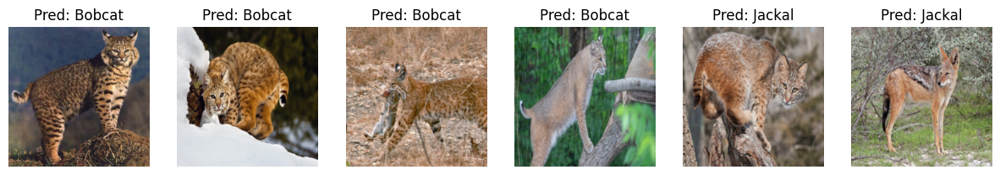


Plotting predictions for VGG (1 block)...


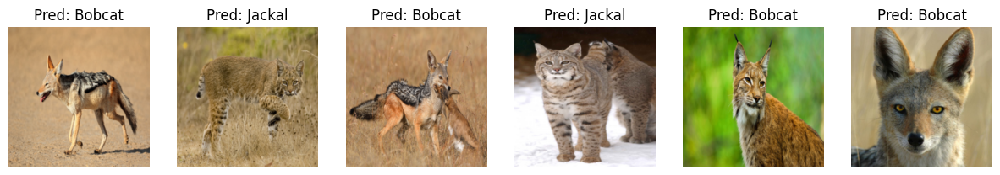


Plotting predictions for VGG (3 blocks)...


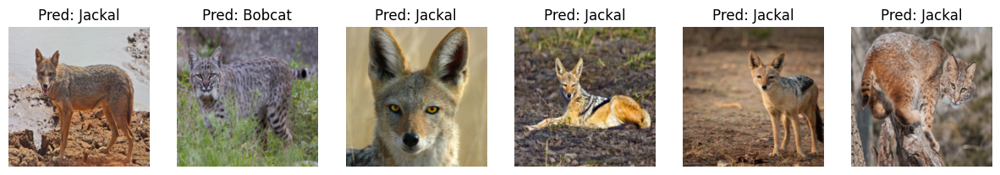

In [94]:

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# # Create and train VGG (1 block)
# model_vgg_1 = create_vgg_model(num_blocks=1).to(device)
# train_loader = get_data_loader('preprocessed/train', batch_size=32)
# test_loader = get_data_loader('preprocessed/test', batch_size=32)

# criterion = nn.CrossEntropyLoss()
# optimizer_vgg_1 = optim.Adam(model_vgg_1.parameters(), lr=0.001)
# print("Training VGG (1 block)...")
# vgg_1_block = train_and_evaluate(model_vgg_1, train_loader, test_loader, criterion, optimizer_vgg_1, device, num_epochs=10)

# Create and train VGG (3 blocks)
model_vgg_3 = create_vgg_model(num_blocks=3).to(device)
optimizer_vgg_3 = optim.Adam(model_vgg_3.parameters(), lr=0.001)
print("\nTraining VGG (3 blocks)...")
vgg_3_block = train_and_evaluate(model_vgg_3, train_loader, test_loader, criterion, optimizer_vgg_3, device, num_epochs=10)

# Plot predictions for both models
print("\nPlotting predictions for VGG (1 block)...")
plot_predictions(model_vgg_1, test_loader, device, num_images=6)

print("\nPlotting predictions for VGG (3 blocks)...")
plot_predictions(model_vgg_3, test_loader, device, num_images=6)


In [71]:
from torchvision import transforms
from PIL import Image
import numpy as np

# Updated function to load data with data augmentation
def get_data_loader_augmented(data_dir, batch_size=32, augment=False):
    if augment:
        transform = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(15),  # Randomly rotate by up to 15 degrees
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
    else:
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    dataset = PreProcessedDatasetAug(data_dir, transform=transform)
    data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return data_loader

class PreProcessedDatasetAug(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = Path(data_dir)
        self.file_paths = list(self.data_dir.glob('**/*.pt'))
        self.labels = [0 if 'bobcat' in str(path).lower() else 1 for path in self.file_paths]
        self.transform = transform

        # Debug: Print number of files found
        print(f"Found {len(self.file_paths)} .pt files in {data_dir}")

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        file_path = self.file_paths[idx]
        image_tensor = torch.load(file_path)  # Load the .pt file
        label = self.labels[idx]

        # Convert the tensor to a PIL Image
        image_array = image_tensor.permute(1, 2, 0).numpy()  # Convert to H x W x C format for PIL
        image = Image.fromarray((image_array * 255).astype(np.uint8))  # Convert to uint8 for PIL

        # Apply the transformation if provided
        if self.transform:
            image = self.transform(image)

        return image, label


/var/folders/4k/xxxy9tg127s6hyrvg1srwct00000gn/T/ipykernel_22514/3610251370.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  img_tensor = torch.load(file_paths[i])  # Lo

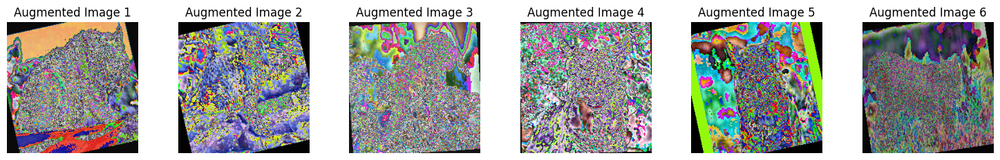

In [72]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from pathlib import Path
from PIL import Image
import numpy as np

# Function to visualize augmented images
def visualize_augmented_images(data_dir, num_images=6, seed=42):
    # Set a seed for reproducibility
    torch.manual_seed(seed)

    # Define the augmentation transform
    augmentation_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Load image paths
    file_paths = list(Path(data_dir).glob('**/*.pt'))

    # Visualize augmented images
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.tight_layout()

    for i in range(min(num_images, len(file_paths))):
        img_tensor = torch.load(file_paths[i])  # Load preprocessed image tensor

        # Convert the tensor to a PIL Image
        img_array = img_tensor.permute(1, 2, 0).numpy()  # Convert to H x W x C format for PIL
        img_array = (img_array * 255).astype(np.uint8)  # Scale to 0-255 for PIL compatibility
        img = Image.fromarray(img_array)

        # Apply the augmentation transform
        augmented_img = augmentation_transform(img)

        # Denormalize for visualization
        mean = torch.tensor([0.485, 0.456, 0.406])
        std = torch.tensor([0.229, 0.224, 0.225])
        augmented_img = augmented_img * std[:, None, None] + mean[:, None, None]
        augmented_img = augmented_img.permute(1, 2, 0)  # Convert to H x W x C for plotting

        # Plot the image
        axes[i].imshow(augmented_img.numpy())
        axes[i].set_title(f'Augmented Image {i + 1}')
        axes[i].axis('off')

    plt.show()

# Visualize augmented images from the training directory
visualize_augmented_images('preprocessed/train', num_images=6, seed=42)


Found 239 .pt files in preprocessed/train
Found 60 .pt files in preprocessed/test
Number of parameters in model: 12921474


/var/folders/4k/xxxy9tg127s6hyrvg1srwct00000gn/T/ipykernel_22514/914877096.py:42: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  image_tensor = torch.load(file_path)  # Load 

Epoch 1/200, Train Loss: 2.0135, Train Accuracy: 51.46%, Test Loss: 0.7567, Test Accuracy: 50.00%
Epoch 2/200, Train Loss: 0.7149, Train Accuracy: 48.54%, Test Loss: 0.6934, Test Accuracy: 56.67%
Epoch 3/200, Train Loss: 0.6878, Train Accuracy: 51.88%, Test Loss: 0.6918, Test Accuracy: 50.00%
Epoch 4/200, Train Loss: 0.6638, Train Accuracy: 64.44%, Test Loss: 0.7346, Test Accuracy: 46.67%
Epoch 5/200, Train Loss: 0.6398, Train Accuracy: 60.25%, Test Loss: 0.7533, Test Accuracy: 48.33%
Epoch 6/200, Train Loss: 0.6130, Train Accuracy: 64.44%, Test Loss: 0.6971, Test Accuracy: 53.33%
Epoch 7/200, Train Loss: 0.5709, Train Accuracy: 74.90%, Test Loss: 0.6915, Test Accuracy: 73.33%
Epoch 8/200, Train Loss: 0.6322, Train Accuracy: 71.97%, Test Loss: 0.6391, Test Accuracy: 65.00%
Epoch 9/200, Train Loss: 0.5139, Train Accuracy: 75.73%, Test Loss: 0.7286, Test Accuracy: 61.67%
Epoch 10/200, Train Loss: 0.5439, Train Accuracy: 71.13%, Test Loss: 0.5929, Test Accuracy: 70.00%
Epoch 11/200, Train

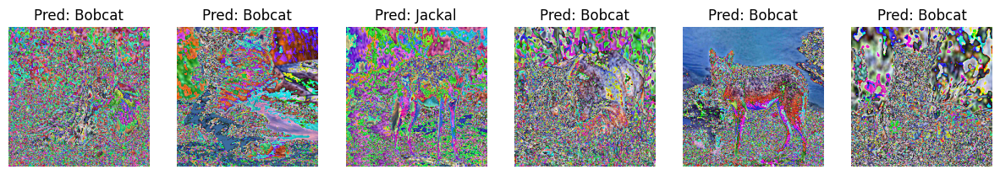

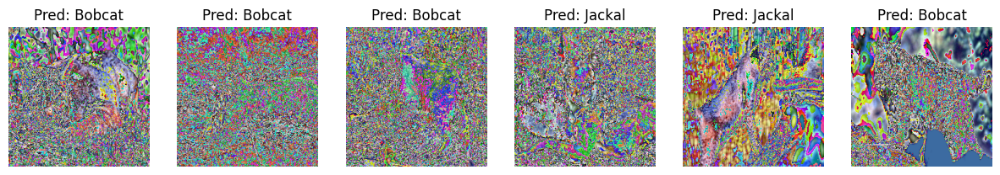

In [73]:

device = torch.device('mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu')
model = create_vgg_model(num_blocks=3).to(device)

# Load training data with augmentation and test data without augmentation
train_loader = get_data_loader_augmented('preprocessed/train', batch_size=32, augment=True)
test_loader = get_data_loader_augmented('preprocessed/test', batch_size=32)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate the model
vgg_3_block_augmented = train_and_evaluate(model, train_loader, test_loader, criterion, optimizer, device, num_epochs=200)

plot_predictions(model, test_loader, device, num_images=6)


In [74]:
import numpy as np
import matplotlib.pyplot as plt
def plot_loss(loss_train, epochs, loss_test = None):
    x_ = np.arange(0, epochs, 1)
    plt.plot(x_, loss_train, label = 'Training Loss')
    if loss_test is not None:
        plt.plot(x_, loss_test, label = 'Testing Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Train and Test Loss per Epoch')
    plt.legend()
    plt.show()

def plot_accuracy(acc_train, epochs, acc_test = None):
    x_ = np.arange(0, epochs, 1)
    plt.plot(x_, acc_train, label = 'Training Accuracy')
    if acc_test is not None:
        plt.plot(x_, acc_test, label = 'Testing Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Train and Test Accuracy per Epoch')
    plt.legend()
    plt.show()


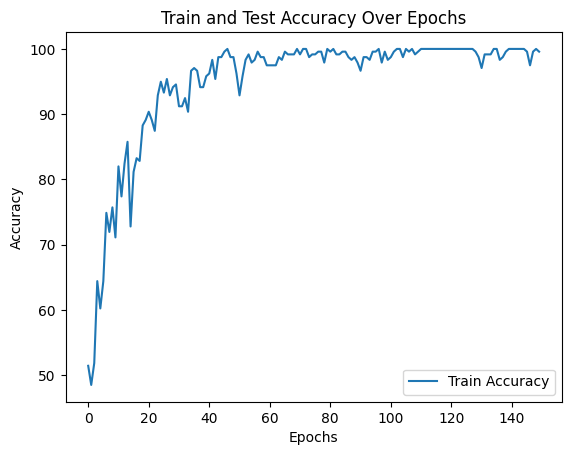

In [75]:
train_acc = vgg_3_block_augmented['Train_Acc'][:150]
# test_acc = vgg_3_block_augmented['TestAcc'][:150]
train_loss = vgg_3_block_augmented['TL/epoch'][:150]
epochs = np.arange(0, 150, 1)
plt.plot(epochs, train_acc, label='Train Accuracy')
# plt.plot(epochs, train_loss, label='Train Loss pre epoch')
# plt.plot(epochs, test_acc, label='Test Accuracy')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Train and Test Accuracy Over Epochs')
plt.legend()
plt.show()

#### Fine-Tuning VGG-16 Models

In [76]:
import torchvision.models as models

def load_pretrained_vgg_fine_tuned(model_type = 'VGG16',num_classes=2, fine_tune_all = False):
    if model_type == 'VGG16':
        model = models.vgg16(pretrained=True)
    elif model_type == 'VGG19':
        model = models.vgg19(pretrained=True)
    else:
        raise ValueError("model_type must be 'VGG16' or 'VGG19'")
    
    model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_classes)

    ## Unfreeze Classifier Layer for fine-tuning
    for p in model.classifier.parameters():
        p.requires_grad = True

    ## Unfreeze convolutional layers if fine_tune -> all layers
    if fine_tune_all:
        for p in model.features.parameters():
            p.requires_grad= True
    else:
        for p in model.features.parameters():
            p.requires_grad = False    


    return model

def train_vgg_fine_tuned(type='VGG16', fine_tune_all = False):
    device = 'mps' if torch.backends.mps.is_available() else 'cpu'
    model = load_pretrained_vgg_fine_tuned(type, 2, fine_tune_all)
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001)

    train_loader = get_data_loader('preprocessed/train', batch_size=32)
    test_loader = get_data_loader('preprocessed/test', batch_size=32)

    visualize_dataset_in_grid('preprocessed/train/bobcat', 6)
    visualize_dataset_in_grid('preprocessed/train/jackal', 6)
    metrics = train_and_evaluate(model, train_loader, test_loader, criterion, optimizer, device, 100)

    if fine_tune_all:
        print('Fine tuning of all layers including convolutional layers complete')
    else:
        print('Fine tuning of classifier layers complete')

    return metrics



/Users/leon/anaconda3/envs/ml_env/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/leon/anaconda3/envs/ml_env/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Found 239 .pt files in preprocessed/train
Found 60 .pt files in preprocessed/test


/var/folders/4k/xxxy9tg127s6hyrvg1srwct00000gn/T/ipykernel_22514/3422852374.py:43: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  selected_tensors = [torch.load(file_paths[i]

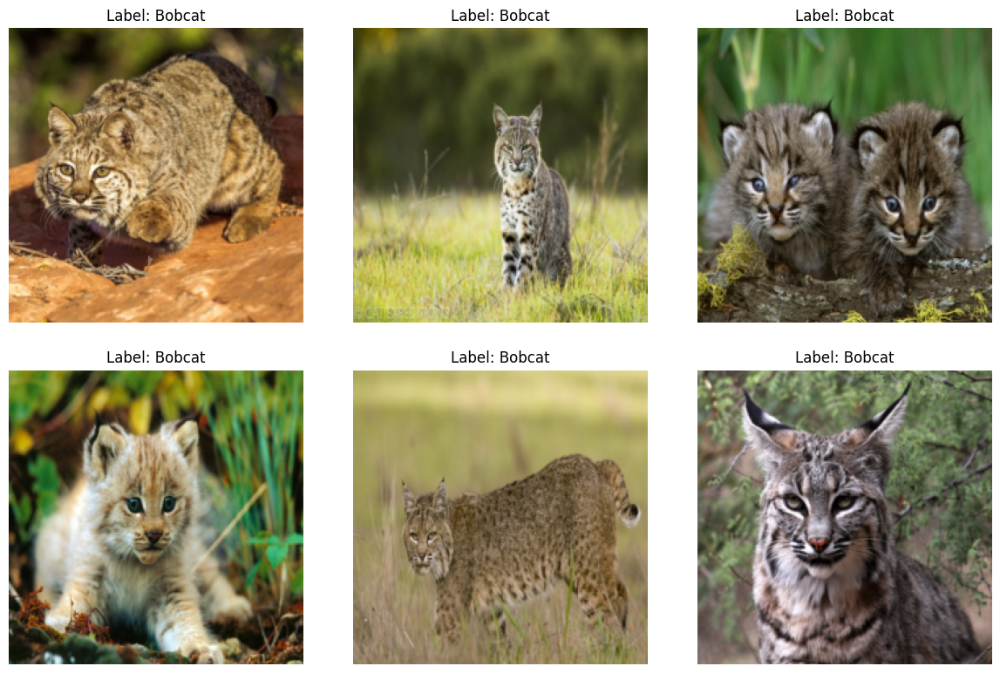

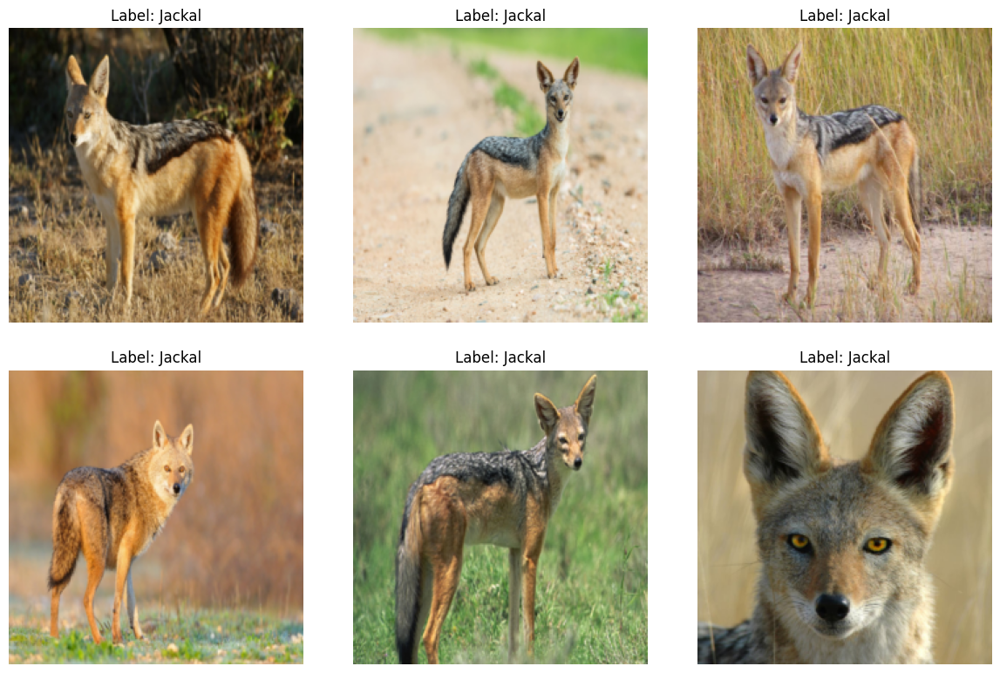

Number of parameters in model: 119554050
Epoch 1/100, Train Loss: 1.3811, Train Accuracy: 84.94%, Test Loss: 0.2682, Test Accuracy: 93.33%
Epoch 2/100, Train Loss: 0.1789, Train Accuracy: 97.91%, Test Loss: 2.2221, Test Accuracy: 85.00%
Epoch 3/100, Train Loss: 0.2252, Train Accuracy: 98.33%, Test Loss: 0.0000, Test Accuracy: 100.00%
Epoch 4/100, Train Loss: 0.0000, Train Accuracy: 100.00%, Test Loss: 0.8808, Test Accuracy: 96.67%
Epoch 5/100, Train Loss: 0.0732, Train Accuracy: 99.58%, Test Loss: 0.0000, Test Accuracy: 100.00%
Epoch 6/100, Train Loss: 0.0000, Train Accuracy: 100.00%, Test Loss: 0.0000, Test Accuracy: 100.00%
Epoch 7/100, Train Loss: 0.0000, Train Accuracy: 100.00%, Test Loss: 0.0000, Test Accuracy: 100.00%
Epoch 8/100, Train Loss: 0.0000, Train Accuracy: 100.00%, Test Loss: 0.0000, Test Accuracy: 100.00%
Epoch 9/100, Train Loss: 0.0000, Train Accuracy: 100.00%, Test Loss: 0.0000, Test Accuracy: 100.00%
Epoch 10/100, Train Loss: 0.0000, Train Accuracy: 100.00%, Test Lo

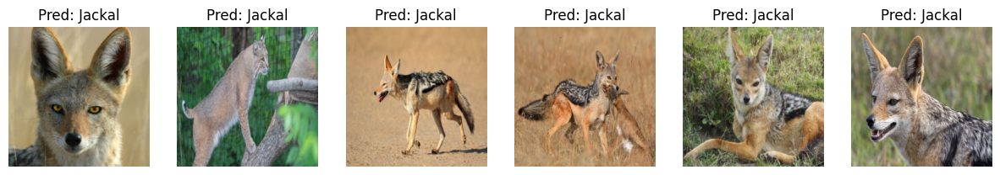

Fine tuning of classifier layers complete


In [77]:
metrics_VGG16_fine_tuned_lastLayer = train_vgg_fine_tuned()

## Loss and Accuracy plots for VGG16 Fine-tuned Dense Classifier Layers

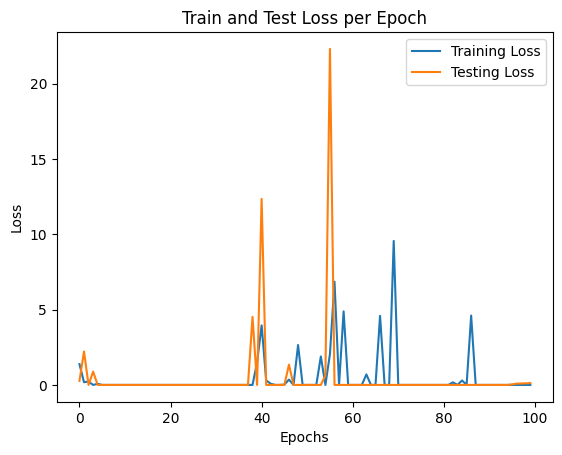

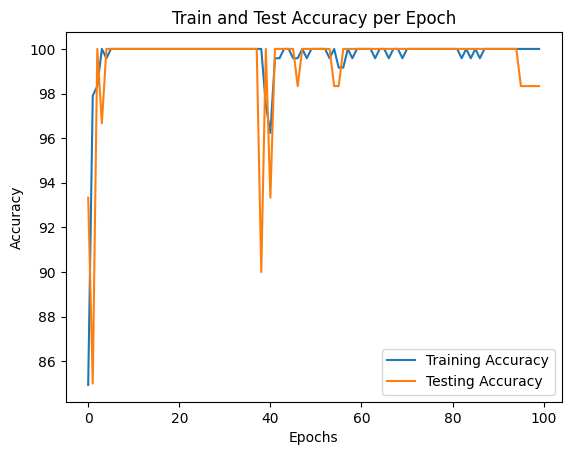

In [103]:
plot_loss(metrics_VGG16_fine_tuned_lastLayer['TL/epoch'], 100, loss_test=metrics_VGG16_fine_tuned_lastLayer['TestL/epoch'])
plot_accuracy(metrics_VGG16_fine_tuned_lastLayer['Train_Acc'], 100, metrics_VGG16_fine_tuned_lastLayer['TestAcc'])

Found 239 .pt files in preprocessed/train
Found 60 .pt files in preprocessed/test


/var/folders/4k/xxxy9tg127s6hyrvg1srwct00000gn/T/ipykernel_22514/3422852374.py:43: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  selected_tensors = [torch.load(file_paths[i]

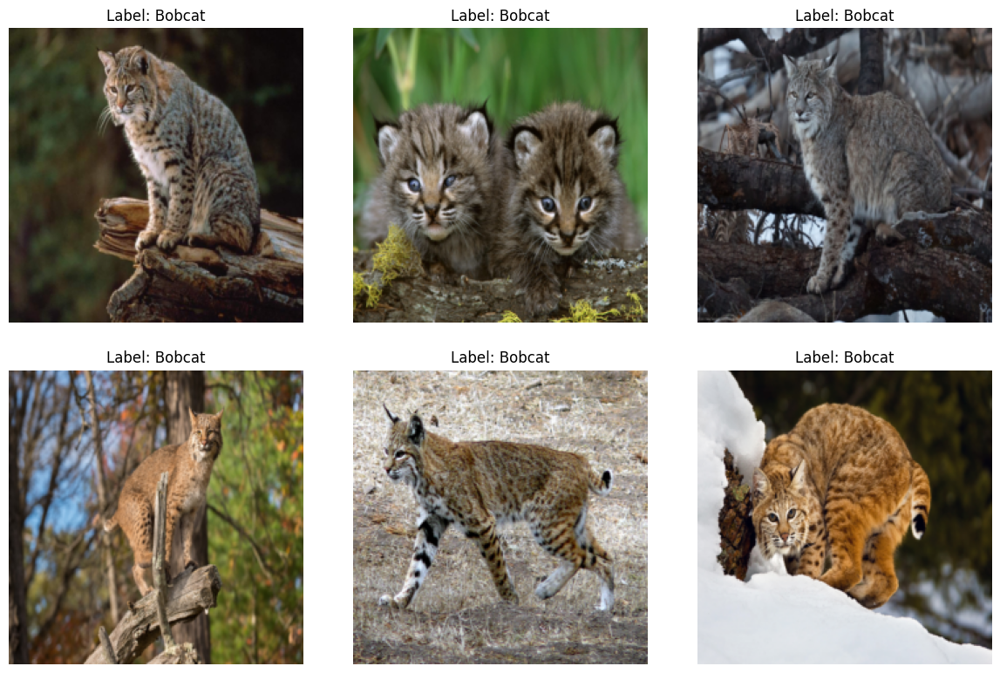

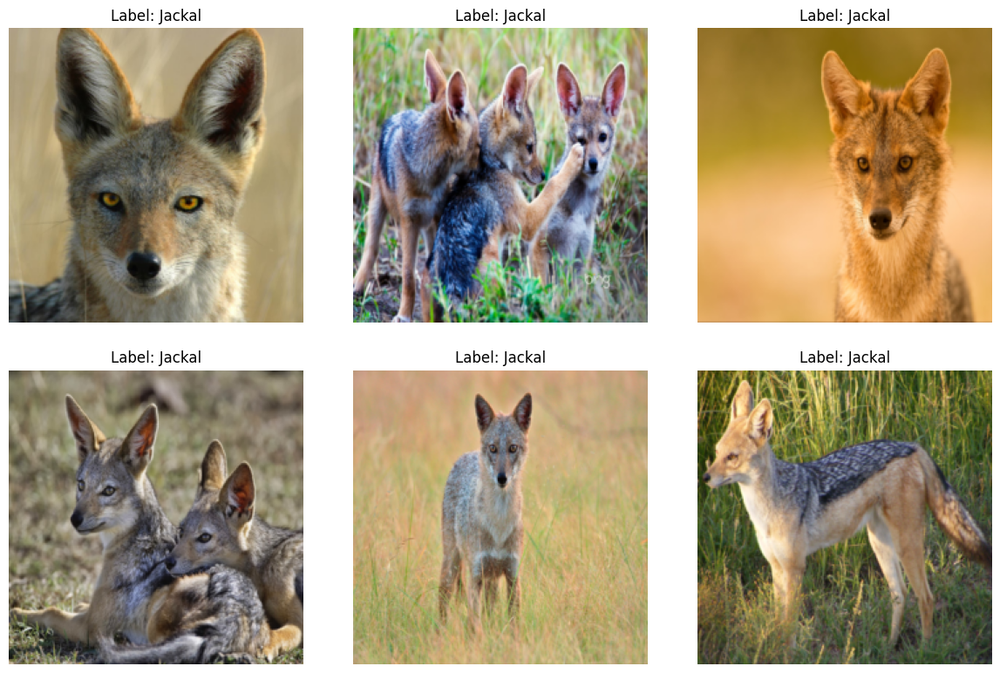

Number of parameters in model: 134268738
Epoch 1/100, Train Loss: 4.9947, Train Accuracy: 56.49%, Test Loss: 0.6926, Test Accuracy: 53.33%
Epoch 2/100, Train Loss: 1.5054, Train Accuracy: 48.54%, Test Loss: 0.7346, Test Accuracy: 50.00%
Epoch 3/100, Train Loss: 0.6984, Train Accuracy: 49.79%, Test Loss: 0.6917, Test Accuracy: 50.00%
Epoch 4/100, Train Loss: 0.6950, Train Accuracy: 47.70%, Test Loss: 0.6857, Test Accuracy: 50.00%
Epoch 5/100, Train Loss: 0.6986, Train Accuracy: 51.46%, Test Loss: 0.6799, Test Accuracy: 60.00%
Epoch 6/100, Train Loss: 0.6922, Train Accuracy: 54.81%, Test Loss: 0.6322, Test Accuracy: 70.00%
Epoch 7/100, Train Loss: 0.7100, Train Accuracy: 51.05%, Test Loss: 0.6347, Test Accuracy: 63.33%
Epoch 8/100, Train Loss: 0.6308, Train Accuracy: 66.11%, Test Loss: 0.5786, Test Accuracy: 68.33%
Epoch 9/100, Train Loss: 0.7276, Train Accuracy: 57.74%, Test Loss: 0.6779, Test Accuracy: 51.67%
Epoch 10/100, Train Loss: 0.6612, Train Accuracy: 56.90%, Test Loss: 0.5708, 

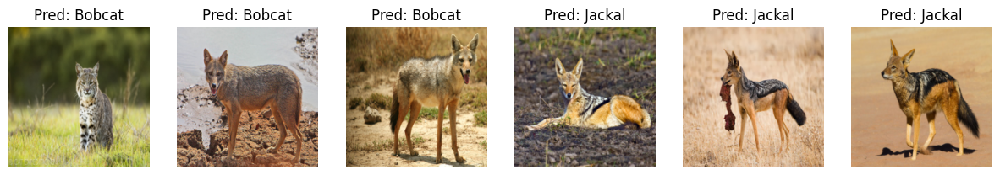

Fine tuning of all layers including convolutional layers complete


In [80]:
metrics_VGG16_fine_tuned_allLayers = train_vgg_fine_tuned('VGG16', True)

## Loss and Accuracy plots for VGG16 Fine-tuned all Layers

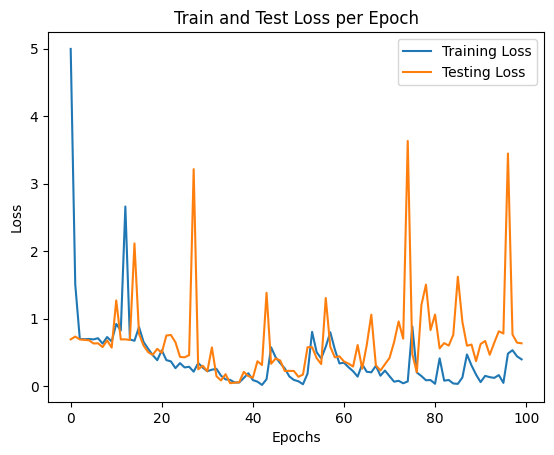

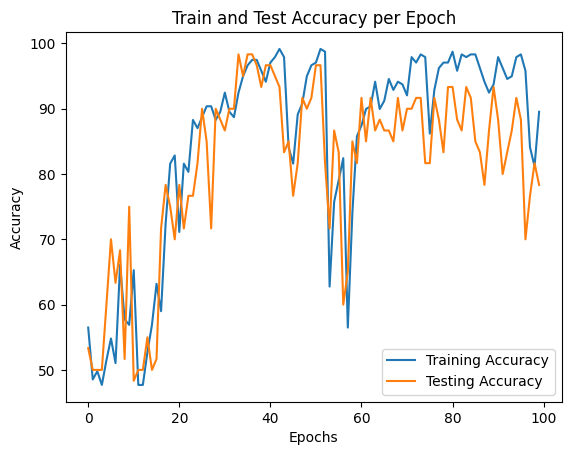

In [81]:
plot_loss(metrics_VGG16_fine_tuned_allLayers['TL/epoch'], 100, loss_test=metrics_VGG16_fine_tuned_allLayers['TestL/epoch'])
plot_accuracy(metrics_VGG16_fine_tuned_allLayers['Train_Acc'], 100, metrics_VGG16_fine_tuned_allLayers['TestAcc'])

## Metrics of all models

In [104]:
import pandas as pd

# Example metrics from different model configurations
metrics_vgg_1 = vgg_1_block
metrics_vgg_3 = vgg_3_block
metrics_vgg_3_aug = vgg_3_block_augmented
metrics_VGG16_FTA = metrics_VGG16_fine_tuned_allLayers
metrics_VGG16_LL = metrics_VGG16_fine_tuned_lastLayer
# Create a list to hold the metrics
all_metrics = [
    {   "Model": "VGG 1 Block",
        "Training time (s)": metrics_vgg_1["Training time (s)"],
        "Training loss": metrics_vgg_1["Training loss"],
        "Training accuracy (%)": metrics_vgg_1["Training accuracy (%)"],
        "Testing accuracy (%)": metrics_vgg_1["Testing accuracy (%)"],
        "Number of parameters": metrics_vgg_1["Number of parameters"]
    },
    {   "Model": "VGG 3 Blocks",
        "Training time (s)": metrics_vgg_3["Training time (s)"],
        "Training loss": metrics_vgg_3["Training loss"],
        "Training accuracy (%)": metrics_vgg_3["Training accuracy (%)"],
        "Testing accuracy (%)": metrics_vgg_3["Testing accuracy (%)"],
        "Number of parameters": metrics_vgg_3["Number of parameters"]
    },
    {   "Model": "VGG 3 Blocks Augmented",
        "Training time (s)": metrics_vgg_3_aug["Training time (s)"],
        "Training loss": metrics_vgg_3_aug["Training loss"],
        "Training accuracy (%)": metrics_vgg_3_aug["Training accuracy (%)"],
        "Testing accuracy (%)": metrics_vgg_3_aug["Testing accuracy (%)"],
        "Number of parameters": metrics_vgg_3_aug["Number of parameters"]
    },
    {   "Model": "VGG 16 FT All",
        "Training time (s)": metrics_VGG16_FTA["Training time (s)"],
        "Training loss": metrics_VGG16_FTA["Training loss"],
        "Training accuracy (%)": metrics_VGG16_FTA["Training accuracy (%)"],
        "Testing accuracy (%)": metrics_VGG16_FTA["Testing accuracy (%)"],
        "Number of parameters": metrics_VGG16_FTA["Number of parameters"]
    },
    {   "Model": "VGG 16 FT Last",
        "Training time (s)": metrics_VGG16_LL["Training time (s)"],
        "Training loss": metrics_VGG16_LL["Training loss"],
        "Training accuracy (%)": metrics_VGG16_LL["Training accuracy (%)"],
        "Testing accuracy (%)": metrics_VGG16_LL["Testing accuracy (%)"],
        "Number of parameters": metrics_VGG16_LL["Number of parameters"]
    },
]


# Convert to a pandas DataFrame
metrics_df = pd.DataFrame(all_metrics)

# Display the resulting table
display(metrics_df)

# Optionally, save the table to a CSV file for further analysis
metrics_df.to_csv("model_training_metrics.csv", index=False)


,Model,Training time (s),Training loss,Training accuracy (%),Testing accuracy (%),Number of parameters
0,VGG 1 Block,49.766226,0.000003,100.000000,96.666667,205523458
1,VGG 3 Blocks,29.015585,0.014031,99.581590,96.666667,12921474
2,VGG 3 Blocks Augmented,508.221524,0.000081,100.000000,90.000000,12921474
3,VGG 16 FT All,796.595804,0.396785,89.539749,78.333333,134268738
4,VGG 16 FT Last,282.500331,0.000000,100.000000,98.333333,119554050


In [110]:
import torch
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid
from pathlib import Path

def log_test_set_images(model, test_loader, device, log_dir="runs/test_predictions"):
    # Set up the TensorBoard writer
    writer = SummaryWriter(log_dir=log_dir)
    
    # Ensure model is in evaluation mode
    model.eval()
    model.to(device)

    # Mean and std for de-normalization (for ImageNet-like normalization)
    mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    # Loop through the test data loader
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(test_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            # Get model predictions
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            # Denormalize images for visualization
            images = inputs * std[:, None, None] + mean[:, None, None]  # De-normalize
            images = images.cpu()  # Move to CPU for logging

            # Create a grid of images with predictions
            grid = make_grid(images, nrow=4, padding=2)

            # Log images to TensorBoard with predicted and actual labels
            label_texts = [f"True: {'Bobcat' if label == 0 else 'Jackal'}, Pred: {'Bobcat' if pred == 0 else 'Jackal'}"
                           for label, pred in zip(labels, predicted)]
            writer.add_image(f'Test Set Images Batch {i+1}', grid, global_step=i)
            writer.add_text(f'Predictions Batch {i+1}', "\n".join(label_texts), global_step=i)

    writer.close()
    print(f"Logged all test set images and predictions to TensorBoard at {log_dir}")


device = torch.device('mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu')

test_loader = get_data_loader('preprocessed/test', batch_size=8)
log_test_set_images(model_vgg_3, test_loader, device)


Found 60 .pt files in preprocessed/test
Logged all test set images and predictions to TensorBoard at runs/test_predictions


In [111]:
import torch
import torch.nn as nn

class MLPComparable(nn.Module):
    def __init__(self, input_size=224*224*3, num_classes=2):
        super(MLPComparable, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(input_size, 8192),
            nn.ReLU(inplace=True),
            nn.Linear(8192, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, 2048),
            nn.ReLU(inplace=True),
            nn.Linear(2048, 1024),
            nn.ReLU(inplace=True),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the input
        x = self.classifier(x)
        return x

# Example instantiation
mlp_model = MLPComparable()

In [114]:
get_num_parameters(mlp_model)

1277706754

In [115]:
device = torch.device('mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu')
mlp_model = MLPComparable().to(device)

In [116]:
import torch.optim as optim
from torch.utils.data import DataLoader

# Assuming you already have preprocessed train and test data loaders
train_loader = get_data_loader('preprocessed/train', batch_size=32)
test_loader = get_data_loader('preprocessed/test', batch_size=32)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(mlp_model.parameters(), lr=0.001)


Found 239 .pt files in preprocessed/train
Found 60 .pt files in preprocessed/test


In [120]:
from tqdm import tqdm

def train_mlp(model, train_loader, criterion, optimizer, device, num_epochs=10):
    model.to(device)
    training_loss = []

    for epoch in tqdm(range(num_epochs)):
        model.train()
        running_loss = 0.0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(train_loader)
        training_loss.append(avg_loss)
        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {avg_loss:.6f}")

    print("Training Complete")
    return model, training_loss


In [122]:
torch.mps.empty_cache()

### Training MLP takes too much memory

In [127]:
# Train the MLP model
mlp_model, train_loss_mlp = train_mlp(mlp_model, train_loader, criterion, optimizer, device, num_epochs=10)

  0%|          | 0/10 [00:29<?, ?it/s]


RuntimeError: MPS backend out of memory (MPS allocated: 15.29 GB, other allocations: 10.56 MB, max allowed: 18.13 GB). Tried to allocate 4.59 GB on private pool. Use PYTORCH_MPS_HIGH_WATERMARK_RATIO=0.0 to disable upper limit for memory allocations (may cause system failure).

In [ ]:
import torch.nn.functional as F

def evaluate_model(model, data_loader, criterion, device):
    model.eval()  
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            # Calculate accuracy
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_loss = test_loss / len(data_loader)
    accuracy = 100 * correct / total
    return avg_loss, accuracy

# Evaluate the MLP model
# mlp_test_loss, mlp_test_accuracy = evaluate_model(mlp_model, test_loader, criterion, device)

# print(f"Test Loss: {mlp_test_loss:.4f}, Test Accuracy: {mlp_test_accuracy:.2f}%")


## AI generated Images

- **Class A (easy)** : A clear, high-resolution image of a bobcat in a natural forest setting, facing the camera with distinctive spotted fur, well-lit, and with no obstructions.

- **Class A (hard)** : A blurred or partially obscured image of a bobcat hiding in dense vegetation, with low light conditions, making it difficult to see the full body clearly

- **Class B (easy)** : A clear, high-resolution image of a jackal standing in an open field during the day, facing sideways, showing its long legs and distinctive bushy tail, in bright sunlight.

- **Class B (hard)** : A jackal lying down in a shaded area, partially covered by tall grass, in twilight, with only parts of its face visible

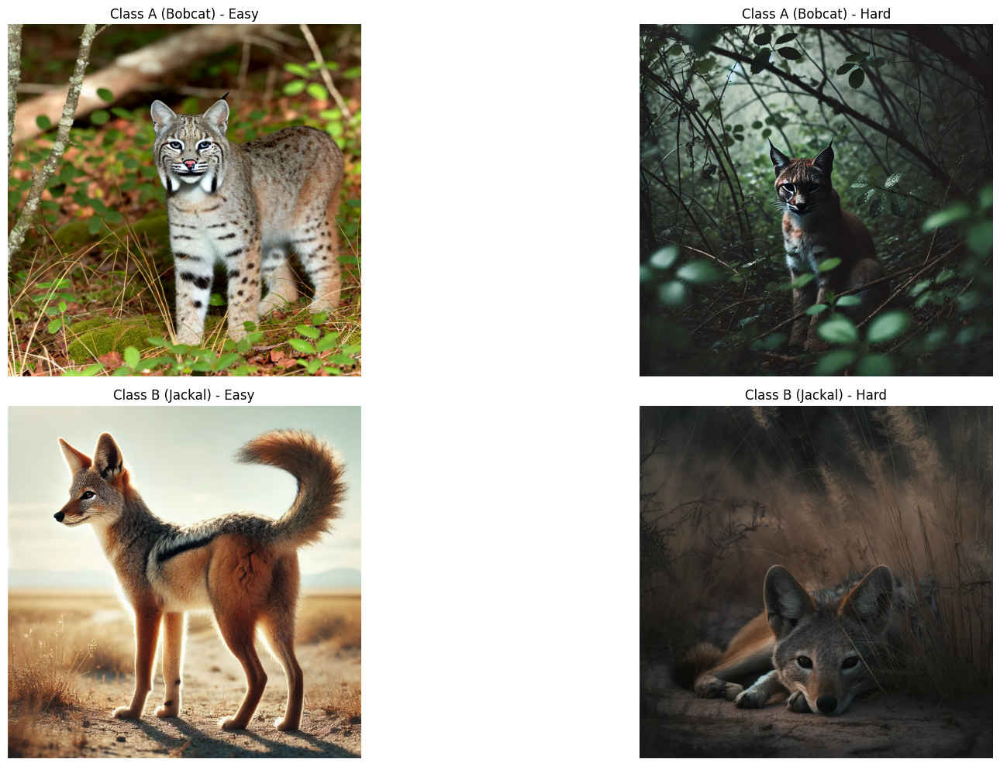

In [130]:
import matplotlib.pyplot as plt
from PIL import Image

# Paths to the generated images
image_paths = [
    "AI Gen Images/class-A easy.jpg",
    "AI Gen Images/class-A hard.jpg",
    "AI Gen Images/class-B easy.jpg",
    "AI Gen Images/class-B hard.jpg"
]

# Titles for each of the images to indicate their category and difficulty level
titles = [
    "Class A (Bobcat) - Easy",
    "Class A (Bobcat) - Hard",
    "Class B (Jackal) - Easy",
    "Class B (Jackal) - Hard"
]

# Displaying the images using matplotlib
fig, axes = plt.subplots(2, 2, figsize=(20, 10))

# Flatten the 2D axes array for easier iteration
axes = axes.flatten()

for ax, img_path, title in zip(axes, image_paths, titles):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

metrics_vgg_1 = vgg_1_block

metrics_vgg_3 = vgg_3_block

metrics_vgg_3_aug = vgg_3_block_augmented

metrics_VGG16_FTA = metrics_VGG16_fine_tuned_allLayers

metrics_VGG16_LL = metrics_VGG16_fine_tuned_lastLayer

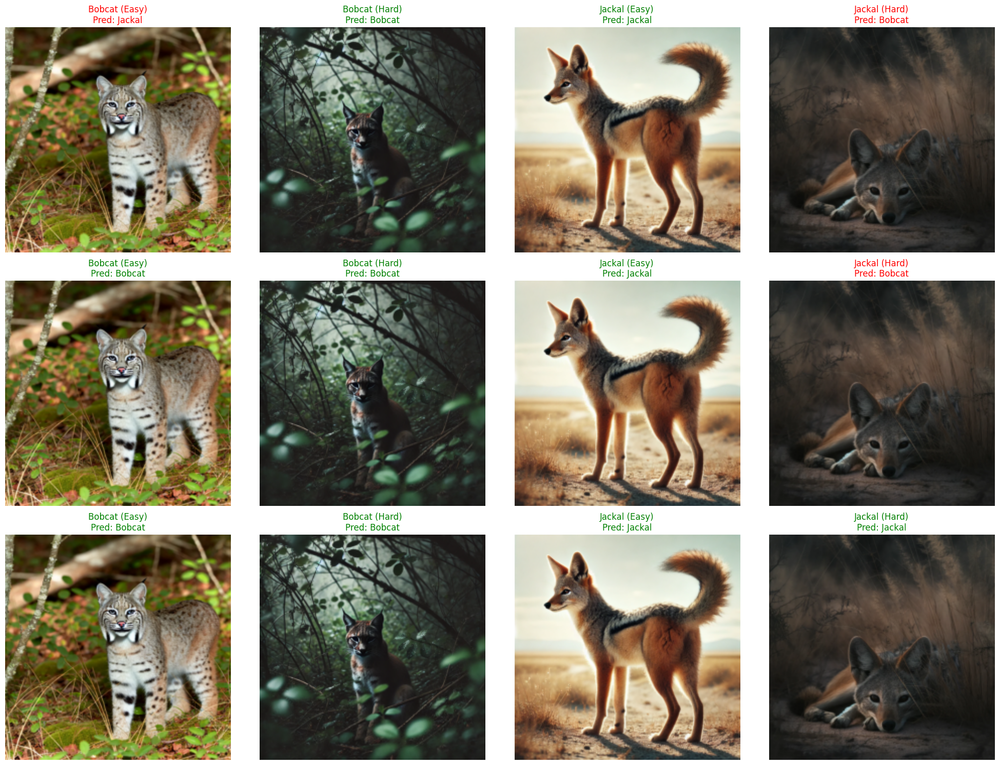

In [132]:
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

def plot_predictions(image_paths, models, device, transform):
    # Set up the figure
    fig, axes = plt.subplots(len(models), 4, figsize=(20, 5*len(models)))
    if len(models) == 1:
        axes = axes.reshape(1, -1)
    
    # Original transform for display (just resize)
    display_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])
    
    # For each model
    for model_idx, (model_name, model) in enumerate(models.items()):
        model.to(device)
        model.eval()
        
        # For each image
        for img_idx, img_path in enumerate(image_paths):
            # Load and process image for model
            image = Image.open(img_path).convert('RGB')
            input_tensor = transform(image).unsqueeze(0).to(device)
            
            # Get prediction
            with torch.no_grad():
                output = model(input_tensor)
                _, prediction = torch.max(output, 1)
            
            # Get true label and difficulty
            true_label = 'Bobcat' if img_idx < 2 else 'Jackal'
            difficulty = 'Easy' if img_idx % 2 == 0 else 'Hard'
            predicted_label = 'Bobcat' if prediction.item() == 0 else 'Jackal'
            
            # Display image
            display_image = display_transform(image)
            display_image = display_image.permute(1, 2, 0)  # Change from CxHxW to HxWxC
            
            # Plot with labels
            ax = axes[model_idx, img_idx]
            ax.imshow(display_image)
            ax.axis('off')
            
            # Color code the prediction (green if correct, red if wrong)
            color = 'green' if true_label == predicted_label else 'red'
            
            # Add title with true and predicted labels
            title = f'{true_label} ({difficulty})\nPred: {predicted_label}'
            ax.set_title(title, color=color)
            
        # Add model name to the left
        axes[model_idx, 0].set_ylabel(model_name, size='large', rotation=0, labelpad=50, va='center')
    
    plt.tight_layout()
    return fig

# Use the function
fig = plot_predictions(image_paths, models, device, transform)
plt.show()